### Downloading the dataset

In [ ]:
!wget --no-check-certificate https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip

--2023-06-09 11:41:14--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.6.128, 108.177.112.128, 74.125.124.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.6.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip.2’

cats_and_dogs_filte 100%[===================>]  65.43M   263MB/s    in 0.2s    

2023-06-09 11:41:14 (263 MB/s) - ‘cats_and_dogs_filtered.zip.2’ saved [68606236/68606236]



In [ ]:
import zipfile

# Unzip the archive
local_zip = './cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall()
zip_ref.close()


#### Directory Setup
##### cats_and_dogs_filter
> ##### train
> > cats
> > > .jpg, .jpg, ...

> > dogs
> > > .jpg, .jpg, ...

> ##### validation
> > cats
> > > .jpg, .jpg, ...

> > dogs
> > > .jpg, .jpg, ...













In [ ]:
import os

base_dir = 'cats_and_dogs_filtered'
print("Contents of base directory:")
print(os.listdir(base_dir))

print("\nContents of train directory:")
print(os.listdir(f'{base_dir}/train'))

print("\nContents of validation directory:")
print(os.listdir(f'{base_dir}/validation'))

Contents of base directory:
['validation', 'vectorize.py', 'train']

Contents of train directory:
['cats', 'dogs']

Contents of validation directory:
['cats', 'dogs']


### Loading the dataset

In [ ]:
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)

print(train_cat_fnames[:10])
print(train_dog_fnames[:10])

['cat.166.jpg', 'cat.559.jpg', 'cat.543.jpg', 'cat.376.jpg', 'cat.64.jpg', 'cat.246.jpg', 'cat.893.jpg', 'cat.600.jpg', 'cat.697.jpg', 'cat.275.jpg']
['dog.779.jpg', 'dog.118.jpg', 'dog.741.jpg', 'dog.604.jpg', 'dog.207.jpg', 'dog.539.jpg', 'dog.666.jpg', 'dog.148.jpg', 'dog.898.jpg', 'dog.646.jpg']


In [ ]:
print('Total training images: ', len(train_cat_fnames) + len(train_dog_fnames))
print('Total validation images: ', len(os.listdir(validation_cats_dir)) + len(os.listdir(validation_dogs_dir)))

Total training images:  2000
Total validation images:  1000


### Visualizing the data

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

pic_idx = 0

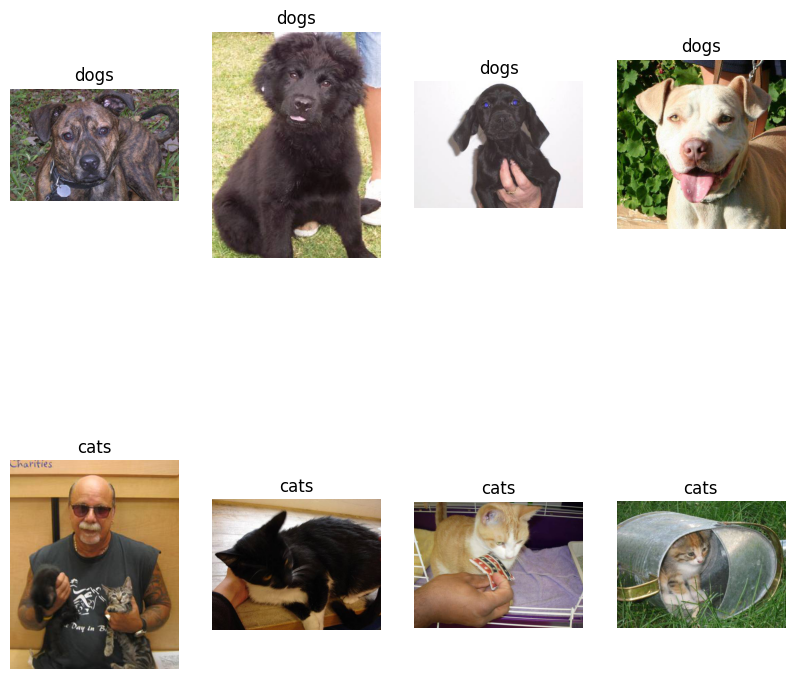

In [ ]:
nrows = 2
ncols = 4
pic_idx += 4
next_dogs_idx = [os.path.join(train_dogs_dir, fname) for fname in train_dog_fnames[pic_idx-4:pic_idx]]
next_cats_idx = [os.path.join(train_cats_dir, fname) for fname in train_cat_fnames[pic_idx-4:pic_idx]]

plt.figure(figsize=(10, 10))
for i, img_path in enumerate(next_dogs_idx + next_cats_idx):
  ax = plt.subplot(nrows, ncols, i+1)
  img = mpimg.imread(img_path)
  plt.imshow(img)
  plt.title(img_path[29:img_path.find('/', 29)])
  plt.axis('off')

### Data Preprocessing and Generator

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Normalizing the pixel values
train_datagen = ImageDataGenerator(rescale=1.0/255.)
test_datagen = ImageDataGenerator(rescale=1.0/255.)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size=16,
                                                    class_mode='binary',
                                                    target_size=(150, 150))

validation_generator = test_datagen.flow_from_directory(validation_dir,
                                                        batch_size=16,
                                                        class_mode='binary',
                                                        target_size=(150, 150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


### Building the model

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(150, 150, 3)), # desired size of image is 150x150x3 where 3 represents the color depth
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')

])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 74, 74, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 17, 17, 64)      

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer=RMSprop(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=125,
    epochs=15,
    validation_data=validation_generator,
    validation_steps=62,
    verbose=2
)

Epoch 1/15
125/125 - 14s - loss: 0.7412 - accuracy: 0.5405 - val_loss: 0.6677 - val_accuracy: 0.5756 - 14s/epoch - 115ms/step
Epoch 2/15
125/125 - 13s - loss: 0.6443 - accuracy: 0.6195 - val_loss: 0.5904 - val_accuracy: 0.6714 - 13s/epoch - 102ms/step
Epoch 3/15
125/125 - 11s - loss: 0.5747 - accuracy: 0.7050 - val_loss: 0.5558 - val_accuracy: 0.7298 - 11s/epoch - 85ms/step
Epoch 4/15
125/125 - 11s - loss: 0.4991 - accuracy: 0.7560 - val_loss: 0.5868 - val_accuracy: 0.6986 - 11s/epoch - 87ms/step
Epoch 5/15
125/125 - 11s - loss: 0.4396 - accuracy: 0.8035 - val_loss: 0.5726 - val_accuracy: 0.7359 - 11s/epoch - 86ms/step
Epoch 6/15
125/125 - 11s - loss: 0.3656 - accuracy: 0.8385 - val_loss: 0.6313 - val_accuracy: 0.7258 - 11s/epoch - 86ms/step
Epoch 7/15
125/125 - 11s - loss: 0.2843 - accuracy: 0.8725 - val_loss: 0.6059 - val_accuracy: 0.7298 - 11s/epoch - 89ms/step
Epoch 8/15
125/125 - 12s - loss: 0.2046 - accuracy: 0.9185 - val_loss: 0.6838 - val_accuracy: 0.7258 - 12s/epoch - 93ms/ste

### Visualizing the accuracy and loss

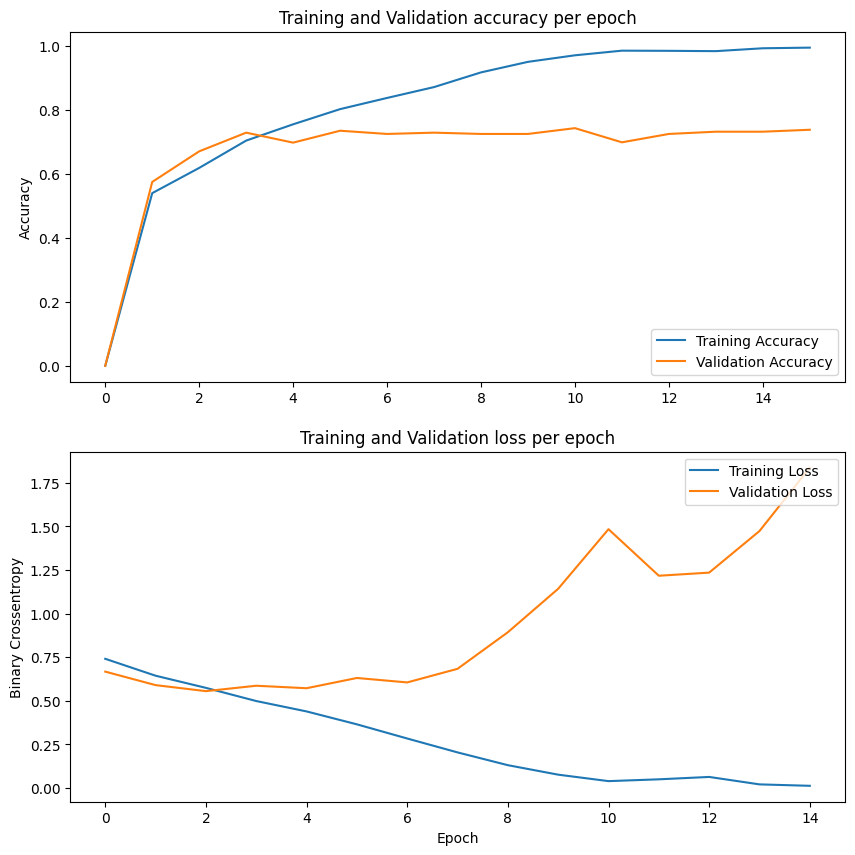

In [ ]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.title("Training and Validation accuracy per epoch")
# plt.figure()

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Binary Crossentropy')
plt.title("Training and Validation loss per epoch")
plt.xlabel('Epoch')
plt.show()

The result shows burnout in the validation loss after 2 epochs, while training loss is steadily going downwards. If we are to end the training at epoch 2 the model would have about 70% accuracy. The overall training suggests the model is having some overfitting.

### Visualizing the intermediate layers

In [ ]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

In [ ]:
# Defining a new model that takes an image as input, and 
# outputs the intermediate representations

# Defining a new model that will take an image as input and outputs intermediate representations for all layers in the previous model after the first
successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs=model.input, outputs=successive_outputs)
visualization_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 64)        18496 

1/1 [==============================] - 2s 2s/step


<ipython-input-15-bb4c6c9ade4d>:23: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std()
<ipython-input-15-bb4c6c9ade4d>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(scale*n_features, scale))


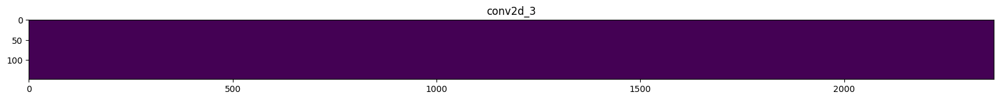

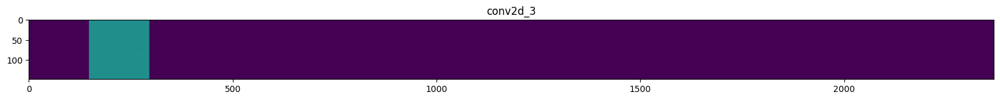

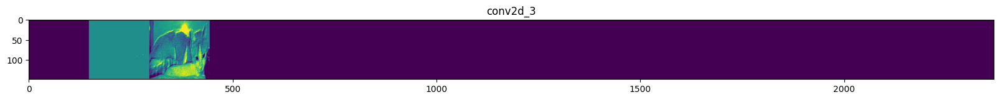

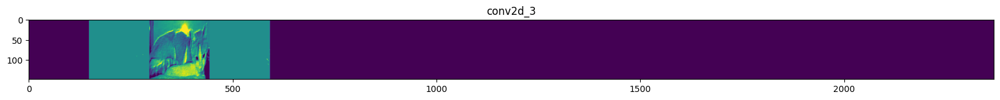

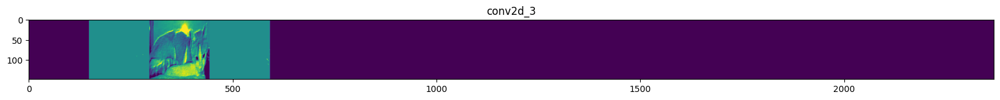

...

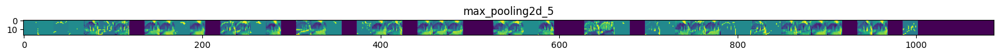

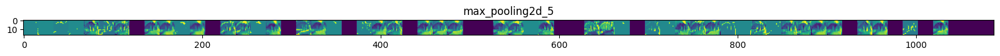

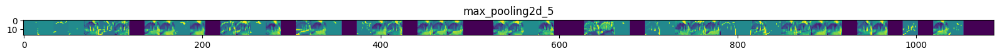

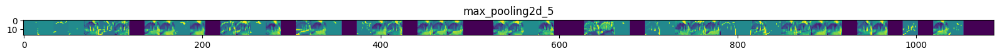

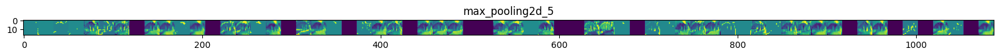

In [ ]:
# Picking random input image
cat_image_files = [os.path.join(train_cats_dir, name) for name in train_cat_fnames]
dog_image_files = [os.path.join(train_dogs_dir, name) for name in train_dog_fnames]
img_path = random.choice(cat_image_files+dog_image_files)
img = load_img(img_path, target_size=(150, 150))
x = img_to_array(img)
x = x.reshape((1, ) + x.shape)
x /= 255.0

# Obtaining all the intermediate representations of this image
successive_feature_maps = visualization_model.predict(x)
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4: # Ruling out FC layers i.e layers other than rank 4 thus only taking feature map of shape (1, size, size, n_feature)
    n_features = feature_map.shape[-1] 
    size = feature_map.shape[1]

    display_grid = np.zeros((size, size*n_features))

    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size: (i + 1) * size] = x

      # Displaying the grid
      scale = 20. / n_features
      plt.figure(figsize=(scale*n_features, scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')